# Rosetta Stone

In [4]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

import torch
import torchvision
from torchvision import transforms

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [3]:
import os

os.chdir('/notebooks/compexp/vision/')
print(os.getcwd())

import sys

sys.path.append('./my')
from rosettastone import maxact
from rosettastone.disentanglement import disentangle_cnn

sys.path.append('')
import settings
from loader.model_loader import loadmodel

/notebooks/compexp/vision
result/alexnet_places365_broden_ade20k_neuron_3


In [4]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:
import wandb

wandb.login()

wandb: Currently logged in as: shlomihod (use `wandb login --relogin` to force relogin)


True

In [6]:
NEURON = 31

## Model and Data: AlexNet Places365

In [7]:
model = loadmodel(None)


def normalize_image(rgb_image):
    img = np.array(rgb_image, dtype=np.float32).copy()
    img = img[:, ::-1]
    img -= [109.5388, 118.6897, 124.6901]
    img = img.transpose((2, 0, 1))
    
    # accuracy is better without rgb -> bgr, not clear why it is necessery
    # perhaps it is necesseray for ADE20K? Don't know right now.
    # img = torch.from_numpy(img[::-1, :, :].copy())
    
    img = torch.from_numpy(img.copy())
    img = img.div_(255.0 * 0.224)
    
    return img


# preprocess = transforms.Compose([
#     transforms.Resize(224),
#     transforms.CenterCrop(224),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
# ])

place365_dataset = torchvision.datasets.Places365(root='/notebooks/compexp/vision/my/data', split='val', small=True,
                                         transform=transforms.Lambda(normalize_image))
place365_dataloader = torch.utils.data.DataLoader(place365_dataset, batch_size=32, num_workers=8, shuffle=False)

In [8]:
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Acc: 0.45821917808219176
last_conv torch.Size([36500, 256, 15, 15]) Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


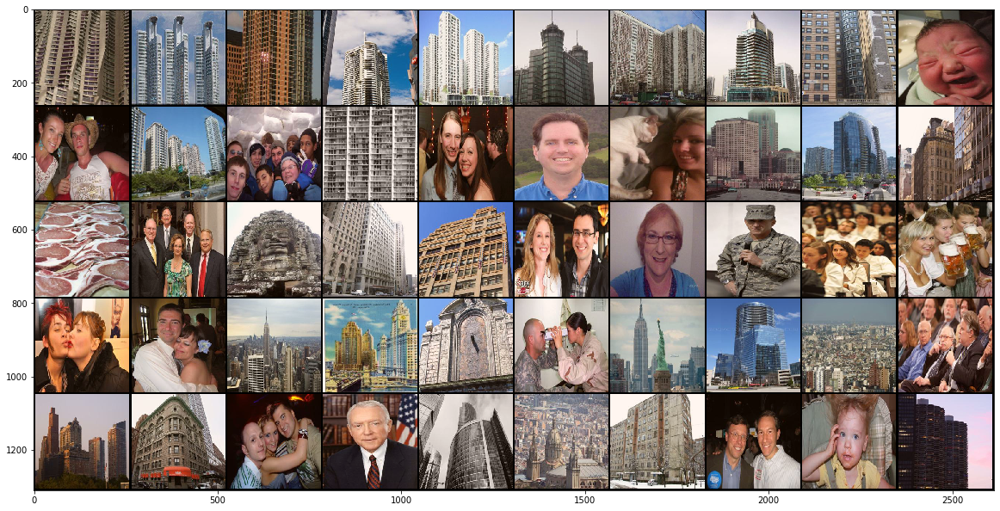

In [102]:
with torch.no_grad():
    orig_activations = maxact.harvest_activations(model, place365_dataloader, {'penultimate_conv': lambda m: m.features[9]},
                                                 apply_fn=lambda x:x.mean(dim=(2,3)))
    
top_penultimate_conv_repers = PCA(n_components=2, random_state=0).fit_transform(orig_activations['penultimate_conv'][top_img_indice, :])

del orig_activations

Acc: 0.45821917808219176
penultimate_conv torch.Size([36500, 256]) ReLU(inplace=True)


In [63]:
with torch.no_grad():
    orig_activations = maxact.harvest_activations(model, place365_dataloader, {'first_conv': lambda m: m.features[0]},
                                                  apply_fn=lambda x:x.mean(dim=(2,3)))
    
top_first_conv_repers = PCA(n_components=2, random_state=0).fit_transform(orig_activations['first_conv'][top_img_indice, :])

del orig_activations

Acc: 0.45821917808219176
first_conv torch.Size([36500, 64]) Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))


<AxesSubplot:>

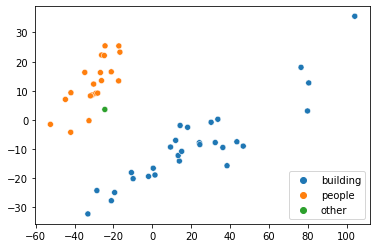

In [155]:
sns.scatterplot(x=top_last_conv_repers[:, 0], y=top_last_conv_repers[:, 1], hue=y_concept)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


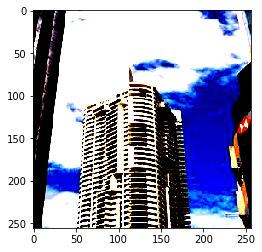

In [90]:
maxact.show(place365_dataset[top_img_indice[(top_last_conv_repers[:, 0] > 99) & (y_concept == 0)]][0])

<AxesSubplot:>

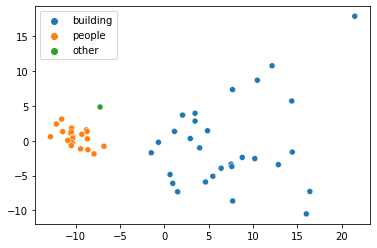

In [153]:
sns.scatterplot(x=top_penultimate_conv_repers[:, 0], y=top_penultimate_conv_repers[:, 1], hue=y_concept)

<AxesSubplot:>

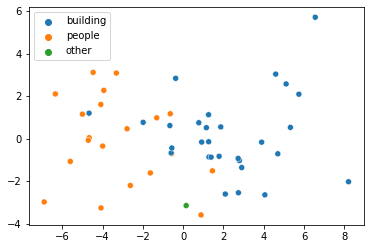

In [154]:
sns.scatterplot(x=top_first_conv_repers[:, 0], y=top_first_conv_repers[:, 1], hue=y_concept)

In [10]:
from torch.utils.data import Dataset, Subset, DataLoader
from imageio import imread

import itertools as it
from tqdm import tqdm

#from torch.utils.data import TensorDataset, 

from dissection.neuron import NeuronOperator



import matplotlib.pylab as plt
from PIL import Image

# nop = NeuronOperator()



concepts = {'building', 'people'}
concept_datasets = {c: Subset(place365_dataset, top_img_indice[y_concept == c])
                    for c in concepts}

concept_dataloaders = {c: InfiniteDataLoader(ds, batch_size=8)
                      for c, ds in concept_datasets.items()}

concept_probs = {c: DataLoader(ds, batch_size=len(ds))
                for c, ds in concept_datasets.items()}

In [30]:
from rosettastone.disentanglement import splitting_operation, succeeding_operation, freezer, get_named_parameters, train, evaluate, plot_act_sorted_line

import copy
from functools import partial
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from tqdm import trange



    
class AlexDisentangleNet(nn.Module):
    def __init__(self, net, neuron, device):
        super().__init__()
        
        self.orig_net = copy.deepcopy(net)
        self.splitted_net = copy.deepcopy(net)
        
        self.neuron = neuron
        self.device = device
        
        self.orig_layer_forward_fn = None
        self.splitted_layer_forward_fn = None
        
        self.layer_getter = None

        self.active_net = 'orig'
        
        self._prepare_splitted()

        
    def _prepare_splitted(self):
        
        freezer(self.orig_net)
        freezer(self.splitted_net)

        self.splitted_net.features[10], _ = splitting_operation(self.orig_net.features[10],
                                                             self.neuron,
                                                             self.device)
        
        self.splitted_net.classifier[1], _ = succeeding_operation(self.orig_net.classifier[1],
                                                             self.neuron,
                                                             self.orig_net.features[10].out_channels,
                                                             self.device)

        self.orig_splitted_layer_forward_fn = forward_up_to(self.orig_net.features, 10)
        self.splitted_layer_forward_fn = forward_up_to(self.splitted_net.features, 10)
        self.layer_getter = lambda m: m.features[10]
        
        self.eval()  # turn off dropout, but also BN and it is not good

        
    def forward(self, x, active_net=None):
        if active_net is None:
            active_net = self.active_net
        assert active_net in ('orig', 'splitted')
        return self.orig_net(x) if active_net == 'orig' else self.splitted_net(x)

    
    def generate_losses(self, x_indff, x_cnpt1, x_cnpt2):
        x_indff_orig = self.orig_net.features(x_indff)
        x_indff_orig = self.orig_net.avgpool(x_indff_orig)
        x_indff_orig = torch.flatten(x_indff_orig, 1)
        x_indff_orig = self.orig_net.classifier[1](x_indff_orig)  # skip dropout

        x_indff_splitted = self.splitted_net.features(x_indff)
        x_indff_splitted = self.splitted_net.avgpool(x_indff_splitted)
        x_indff_splitted = torch.flatten(x_indff_splitted, 1)
        x_indff_splitted = self.splitted_net.classifier[1](x_indff_splitted) # skip dropout

        indff_loss = (torch.flatten(F.mse_loss(x_indff_orig,
                                         x_indff_splitted,
                                                 reduction='none'), 1))    
        x_cnpt1 = self.splitted_layer_forward_fn(x_cnpt1)
        x_cnpt2 = self.splitted_layer_forward_fn(x_cnpt2)
        
        spc11_loss = (x_cnpt1[:, self.neuron, :, :]**2).mean(dim=(1, 2))
        spc12_loss = (x_cnpt1[:, -1, :, :]**2).mean(dim=(1, 2))

        spc21_loss = (x_cnpt2[:, self.neuron, :, :]**2).mean(dim=(1, 2))
        spc22_loss = (x_cnpt2[:, -1, :, :]**2).mean(dim=(1, 2))

        wd1_loss = (self.splitted_net.features[10].weight[self.neuron, :, :, :]**2).mean()
        wd2_loss = (self.splitted_net.features[10].weight[-1, :, :, :]**2).mean()
        
        return (indff_loss,
                torch.zeros((1,1)),#spc11_loss,
                spc22_loss,
                torch.zeros((1,1)),#spc12_loss
                torch.zeros((1,1)),#spc21_loss,
                wd1_loss,
                wd2_loss                
               )
                

    def equality_report(self):
        print()
        print('==', (self.orig_net.features[10].bias[:self.neuron] == self.splitted_net.features[10].bias[:self.neuron]).all())
        print('==', (self.orig_net.features[10].bias[self.neuron+1:] == self.splitted_net.features[10].bias[self.neuron+1:-1]).all())
        print('!=', (self.orig_net.features[10].bias[self.neuron] == self.splitted_net.features[10].bias[self.neuron]).all())
        print('!=', (self.orig_net.features[10].bias[self.neuron] == self.splitted_net.features[10].bias[-1]).all())
        print()
        if self.neuron:
            print('==', (self.orig_net.classifier[1].weight[:, :36*self.neuron] ==  self.splitted_net.classifier[1].weight[:, :36*self.neuron]).any())
        print('==', (self.orig_net.classifier[1].weight[:, 36*(self.neuron+1):] ==  self.splitted_net.classifier[1].weight[:, 36*(self.neuron+1):-36]).any())
        print('!=', (self.orig_net.classifier[1].weight[:, 36*self.neuron:36*(self.neuron+1)] ==  self.splitted_net.classifier[1].weight[:, 36*self.neuron:36*(self.neuron+1)]).any())
        print('!=', (self.splitted_net.classifier[1].weight[:, 36*self.neuron:36*(self.neuron+1)] ==  self.splitted_net.classifier[1].weight[:, -36:]).any())
        print('==', (self.orig_net.classifier[1].bias ==  self.splitted_net.classifier[1].bias).any())
        print()

In [33]:
def plot_maxact(dnet, dataset, dataloader, neuron, which, top_k):
    net = dnet.orig_net if which == 'orig' else dnet.splitted_net
    with torch.no_grad(): 
        activations = maxact.harvest_activations(net, dataloader, {'layer': dnet.layer_getter})
        print('SSS', activations['layer'].shape)
        if which == 'orig':
            ax1 = maxact.plot_neuron_max_activations(activations, dataset, 'layer', neuron, cropped=False, top_k=top_k)
            ax2 = None
        else:
            ax1 = maxact.plot_neuron_max_activations(activations, dataset, 'layer', neuron, cropped=False, top_k=top_k)
            ax2 = maxact.plot_neuron_max_activations(activations, dataset, 'layer', -1, cropped=False, top_k=top_k)
        del activations
    return ax1, ax2


In [3]:
first_concept = 'building'
second_concept = 'people'
neuron = 31
disentanglenet_cls = AlexDisentangleNet
top_k=50
with_maxact=False

with wandb.init(project='disentanglement', save_code=True):
    dnet = disentanglenet_cls(model, neuron, device)
    
    wandb.watch(dnet, log='all', log_freq=100)
    
    print('Pre equality report...')
    dnet.equality_report()
    
    if with_maxact:
        print('Generate maxact plots...')
        ax_init_orig_maxact, _ = plot_maxact(dnet, place365_dataset, place365_dataloader, neuron, 'orig', top_k=top_k)

        ax_init_splitted_maxact_first, ax_init_second_maxact_splitted = plot_maxact(dnet, place365_dataset, place365_dataloader, neuron, 'splitted', top_k=top_k)
        wandb.log({'init_orig_maxact': wandb.Image(ax_init_orig_maxact),
                   'ax_init_splitted_maxact_first': wandb.Image(ax_init_splitted_maxact_first),
                   'ax_init_second_maxact_splitted': wandb.Image(ax_init_second_maxact_splitted)})

    
    print('Probing concepts...')
    wandb.log({'init_act_sorted_line_orig': wandb.Image(plot_concept_activation_line(dnet.orig_layer_forward_fn, concept_probs, neuron, device)),
               'init_act_sorted_line_splitted_first': wandb.Image(plot_concept_activation_line(dnet.splitted_layer_forward_fn, concept_probs, neuron, device)),
               'init_sorted_line_splitted_second': wandb.Image(plot_concept_activation_line(dnet.splitted_layer_forward_fn, concept_probs, -1, device))})
    
    print('Training...')
    train(dnet, place365_dataloader,
          first_concept, second_concept,
          concept_dataloaders, concept_probs,
          epochs=1, device='cuda',
          alpha=1e-2, beta=1e-3)
    
    print('Probing concepts...')
    wandb.log({'final_act_sorted_line_splitted_first': wandb.Image(plot_concept_activation_line(dnet.splitted_layer_forward_fn, concept_probs, neuron, device)),
               'final_sorted_line_splitted_second': wandb.Image(plot_concept_activation_line(dnet.splitted_layer_forward_fn, concept_probs, -1, device))})
    

    print('Post equality report...')
    dnet.equality_report()
    print(evaluate(dnet, place365_dataloader, device))
    
    if with_maxact:
        print('Generate maxact plots...')
    
    
    
    Print('Done!')


NameError: name 'AlexDisentangleNet' is not defined

In [1]:
9

9

In [ ]:
7

Acc: 0.45821917808219176
conv torch.Size([36500, 256, 15, 15]) Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


In [12]:
orig_activations['conv'].shape

torch.Size([36500, 256, 15, 15])

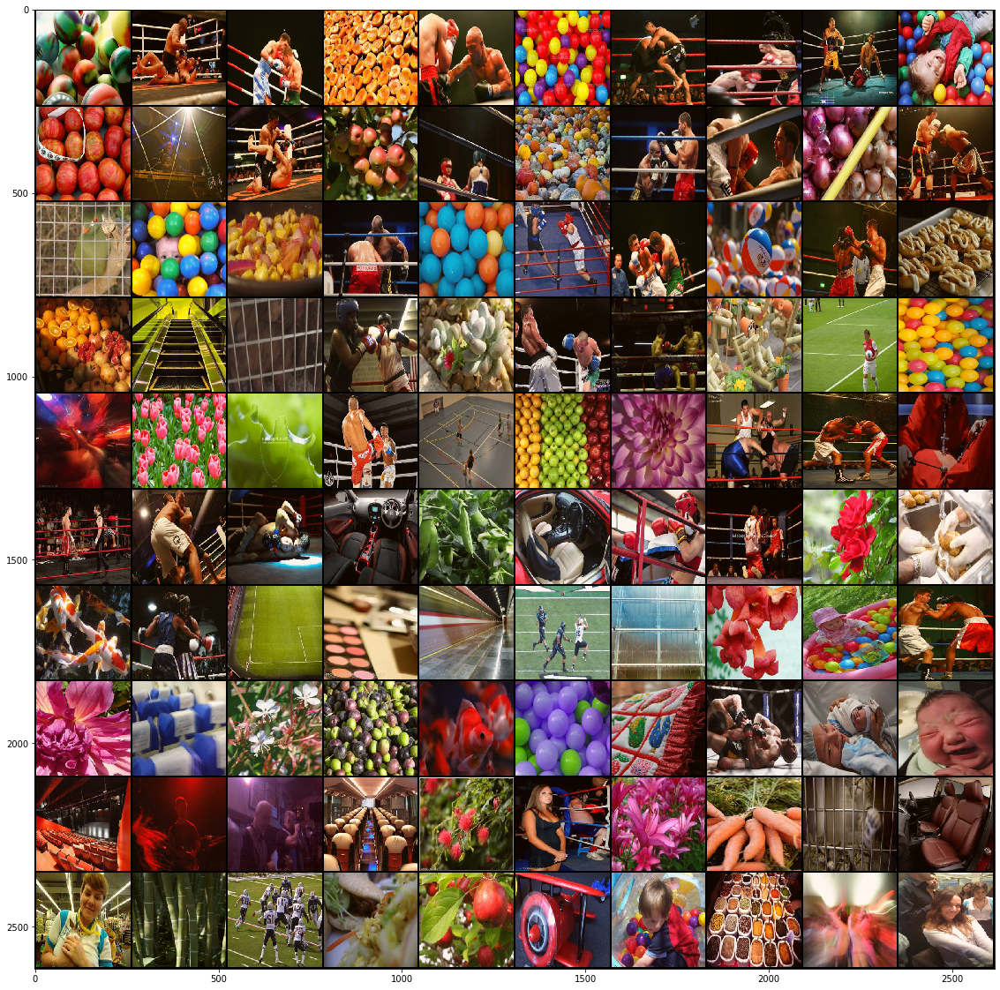

In [15]:
maxact.visualize_neuron('conv', 15, model, orig_activations, place365_dataset, with_cropped=False, with_lucent=False)

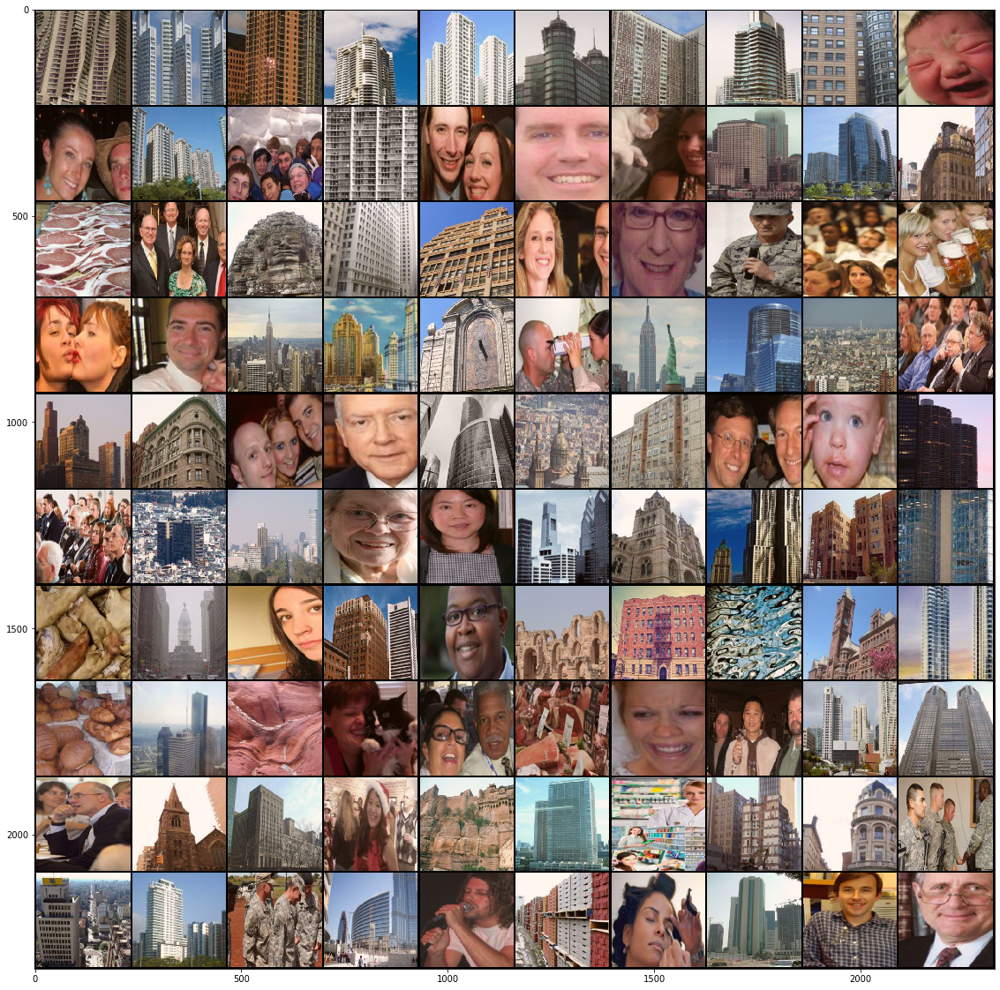

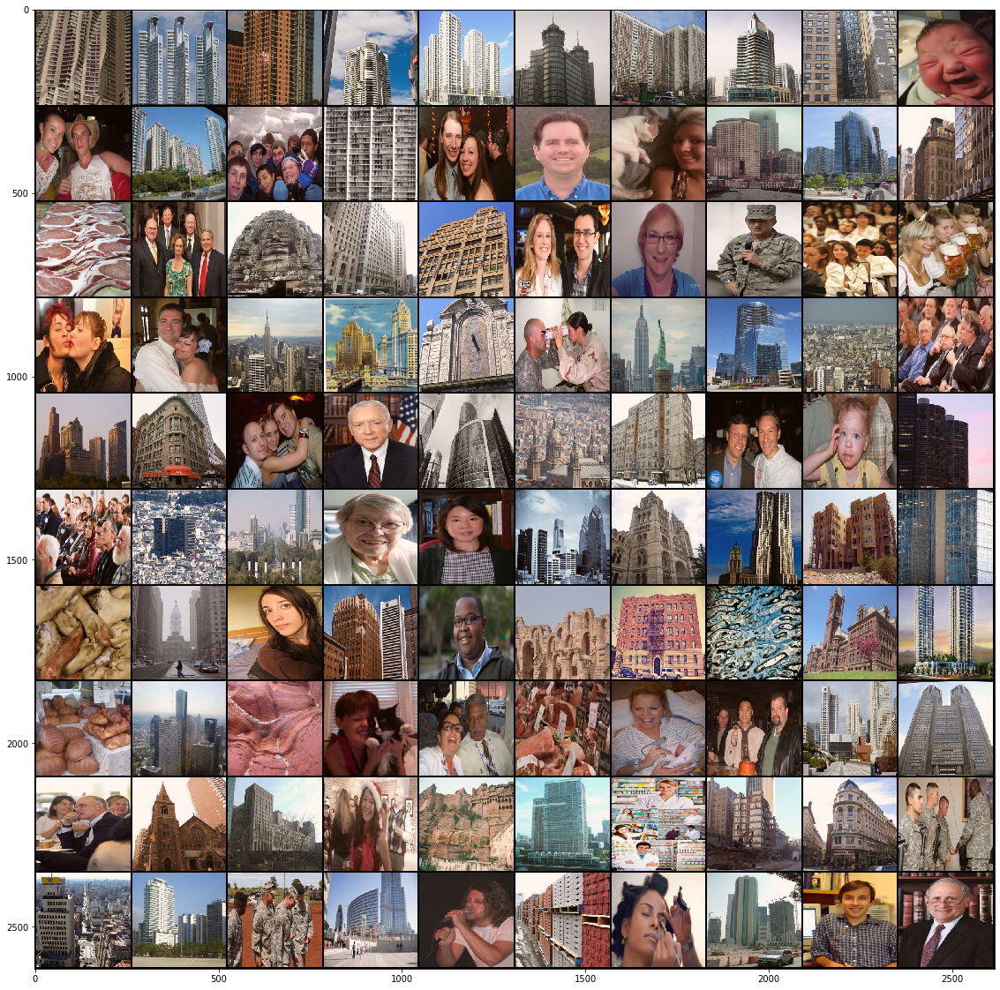

In [22]:
# for i in range(50, 80):
#     maxact.visualize_neuron('conv', i, model, orig_activations, place365_dataset, with_cropped=False, with_lucent=False)

In [15]:
orig_activations = maxact.harvest_activations(dnet.orig_net, place365_dataloader, {'conv': lambda m: m.features[10]})

Acc: 0.45821917808219176
conv torch.Size([36500, 256, 15, 15]) Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


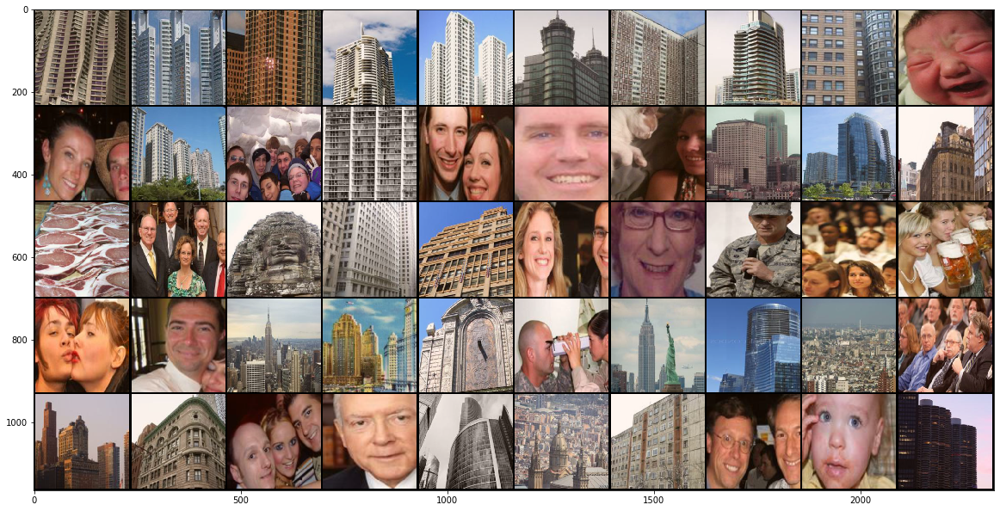

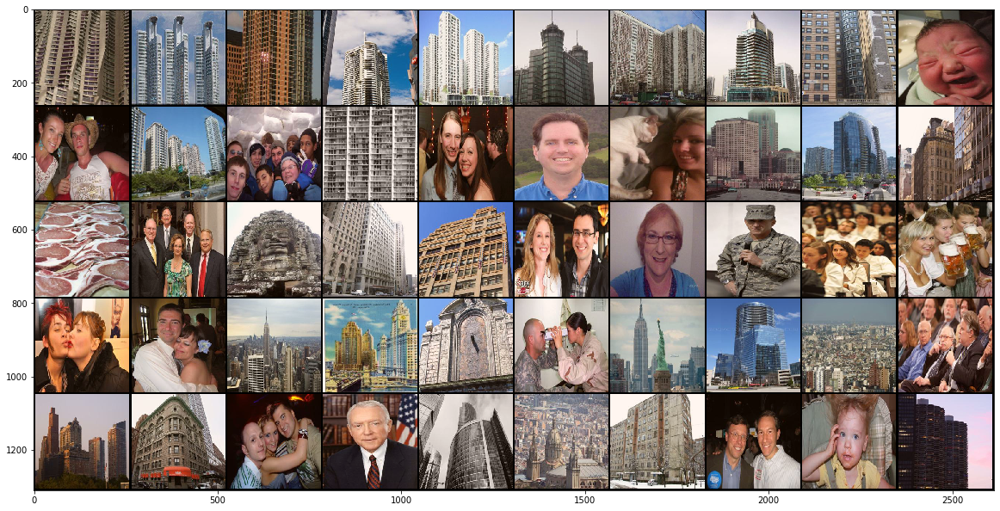

In [84]:
maxact.visualize_neuron('conv', 31, model, orig_activations, place365_dataset, with_cropped=True, with_lucent=False, top_k=50)

In [192]:
(top_img_acts,
 top_img_indice,
 top_raw_acts,
 top_reprs,
 xs, ys) = maxact.get_neuron_max_activations(orig_activations, place365_dataset, 'conv', 31, top_k=50)

y_concept = np.array(['building'] * 9 + ['people'] * 2
                     + ['building'] + ['people'] + ['building']
                     + ['people']*3 + ['building'] * 3
                     + ['other'] + ['people'] + ['building'] * 3
                     + ['people'] * 7 + ['building'] * 3 + ['people']
                     + ['building'] * 3 + ['people'] +['building'] * 2
                     + ['people'] * 2 + ['building'] * 3 + ['people'] * 2 + ['building'])


In [91]:
(top_img_acts > 0).detach().cpu().numpy().mean()

1.0

/opt/conda/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

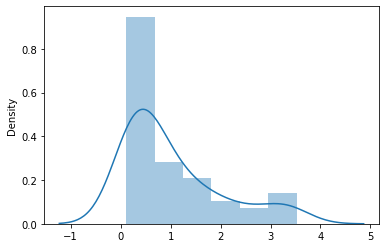

In [177]:
sns.distplot(top_img_acts)

In [179]:
top_reprs_np = top_reprs.detach().cpu().numpy()
top_reprs_np_no_31 = np.delete(top_reprs_np, 31, 1)

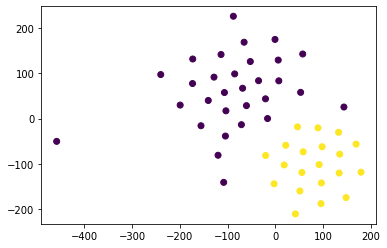

In [187]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)

top_repers_tsne = tsne.fit_transform(top_reprs_np)

plt.scatter(top_repers_tsne[:, 0], top_repers_tsne[:, 1], c=y_concept)

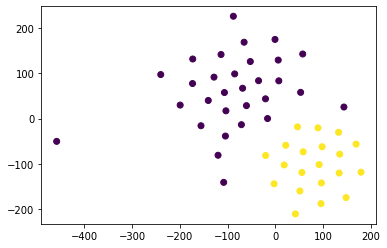

In [188]:
tsne = TSNE(n_components=2, random_state=0)

top_repers_tsne = tsne.fit_transform(top_reprs_np)

plt.scatter(top_repers_tsne[:, 0], top_repers_tsne[:, 1], c=y_concept)

In [27]:
acts = orig_activations['conv'][:, 31, :, :].abs().mean(dim=(1,2))
argact = acts.argsort()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


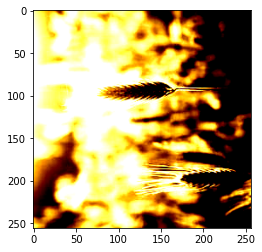

In [57]:
imshow(place365_dataset[argact[5]][0].detach().cpu().numpy().transpose((2,1,0)))

In [39]:
from matplotlib.pylab import imshow

# Dump